<h1 style='color:brown' align='center'><font color="red" align='center' size=+3 face="Comic Sans MS">Classification Précoce des Maladies des Tomates en Agriculture : Une Approche Innovante avec les Concept-Centric Transformers (CCT)  </font></h1>

<h1 style='color:brown' ><font color="red"  size=+3 face="Comic Sans MS">I- Introduction</font></h1>
<h1 style='color:brown' ><font color="blue"  size=+1 face="Comic Sans MS">
Dans ce projet novateur de computer vision, nous avons axé nos efforts sur la classification des images de maladies des tomates en utilisant le modèle Concept-Centric Transformers (CCT). Cette technologie prometteuse offre une solution précise et efficace pour la détection précoce des maladies des plantes, jouant ainsi un rôle crucial dans le domaine de l'agriculture. En fournissant une identification rapide et précise des maladies, notre projet vise à aider les agriculteurs à prendre des mesures proactives, réduisant ainsi les pertes de récolte et favorisant une agriculture plus durable. Cette introduction souligne l'impact significatif de notre travail dans le secteur agricole</font></h1>

<h3 style='color:Red' ><font color="red" align='center' size=+3 face="Comic Sans MS"> II - Jeu de données utilisé</font></h3>
<h2>Classification des maladies des feuilles de tomates</h2>
<h3 style='color:Red' ><font color="blue" align='center' size=+0.5 > 
<p>Plus de 20 000 images de feuilles de tomates avec 10 maladies et 1 classe saine. Les images sont collectées à la fois en laboratoire et dans des environnements naturels. L'objectif est de développer un modèle léger capable de prédire les maladies des feuilles de tomates et de le déployer hors ligne sur une application mobile.</p>
</font></h3>
<h3>Classes :</h3>
<h3 style='color:Red' ><font color="blue" align='center' size=+0.2 > 
<ul>
  <li>Mildiou Tardif</li>
  <li>Sain</li>
  <li>Mildiou Précoce</li>
  <li>Tache Septorienne</li>
  <li>Virus de la Coudure Jaune de la Tomate</li>
  <li>Tache Bactérienne</li>
  <li>Tache Cible</li>
  <li>Virus de la Mosaïque de la Tomate</li>
  <li>Moisissure des Feuilles</li>
  <li>Araignées Rouges (Acariens) - Tétranyque à deux points</li>
  <li>Mildiou Poudreux</li>
</ul></font></h3>
<h3 style='color:Red' ><font color="blue" align='center' size=+0.5 > 
<p>La source originale de la plupart des images est le jeu de données PlantVillage publié <a href="#">ici</a> et <a href="#">ici</a>. Les données ont été augmentées hors ligne en utilisant plusieurs techniques avancées telles que la retournement d'image, la correction gamma, l'injection de bruit, l'augmentation de couleur PCA, la rotation et la mise à l'échelle. Certaines images récentes ont été générées hors ligne avec des GANs. Le sous-ensemble d'images contenant des feuilles de tomates de Taïwan a été augmenté en utilisant des rotations à plusieurs angles, des reflets, une réduction de la luminosité de l'image, etc.</p>
</font></h3>

# **Imports**

In [1]:
# Common
import os
import keras 
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls

# Data Loading
from keras.preprocessing.image import ImageDataGenerator as IDG

# Data Loading
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
from keras.layers import add
from keras.layers import Dense
from keras.layers import Layer
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import MaxPooling2D as  MP
from keras.layers import ZeroPadding2D as  ZP
from keras.layers import LayerNormalization as LN
from keras.layers import MultiHeadAttention as MHA
from keras.models import Sequential, Model

# Optimizer
from tensorflow_addons.optimizers import AdamW

# Model Visualization
from tensorflow.keras.utils import plot_model

# Metrics
from keras.metrics import SparseCategoricalAccuracy as Accuracy, SparseTopKCategoricalAccuracy as TopKAccuracy

# Dataset 
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True


> <h3 style='color:Red' ><font color="blue"  size=+1 > les Hyperparameters  </font></h3>

Before moving ahead let's define some **Hyperparameters and Constants**.

In [2]:
Learning_Rate = 1e-3
Weight_Decay  = 1e-4
FILTERS       = [64,128]
Drop_Rates    = [0.0,0.1]
Dims          = 128
Hidden_units  = [Dims, Dims]
IMAGE_SIZE    = 160

> <h3 style='color:Red' ><font color="blue"  size=+1 > les Fonctions  </font></h3>

In [4]:
def show_images(data, class_names, model=None, GRID=[5,6], SIZE=(30,25)):
    
    # Plotiing Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)
    
    # iterate through the data
    i=1
    for images, labels in iter(data):
        
        # Select data at random
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id],axis=0), class_names[int(labels[id])]
        
        # Make Prediciton
        if model is not None :
            prediction = model.predict(image)[0]
            score = np.round(np.max(prediction),2)
            pred  = class_names[np.argmax(prediction)]
            
            title = "True : {}\nPred : {}\n Score : {:.2}".format(label, pred, score)
        
        else:
            title = label
        cls()
        
        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)
        
        # Break loop
        i+=1
        if i>n_images: break
    
    # Show Final Figure
    plt.show()

<h3 style='color:Red' ><font color="red" align='center' size=+3 face="Comic Sans MS"> III - EDA</font></h3>


 > <h3 style='color:Red' ><font color="green"  size=+2 face="Comic Sans MS"> 1) - la distribution de Dataset  </font></h3>

 > <h3 style='color:Red' ><font color="blue"  size=+1 > 
    Avant de charger les données, jetons un coup d'œil à la distribution des classes. </font></h3>

In [3]:
# Specify the Root Paths
train_path = '/kaggle/input/tomato-disease-multiple-sources/train/'
valid_path = '/kaggle/input/tomato-disease-multiple-sources/valid/'

In [6]:
# get the Class Names
class_names = sorted(os.listdir(train_path))
n_classes   = len(class_names)

# Show 
print("No. of Classes : {}\nClass Names : {}".format(n_classes, class_names))

No. of Classes : 11
Class Names : ['Bacterial_spot', 'Early_blight', 'Late_blight', 'Leaf_Mold', 'Septoria_leaf_spot', 'Spider_mites Two-spotted_spider_mite', 'Target_Spot', 'Tomato_Yellow_Leaf_Curl_Virus', 'Tomato_mosaic_virus', 'healthy', 'powdery_mildew']


> <h3 style='color:Red' ><font color="blue"  size=+1 > 
Chaque classe représente un type de maladie des feuilles de tomate. Examinons le nombre total d'images présent dans chaque classe. C'est la distribution des classes.</font></h3>

In [7]:
# Calculate the Class Distribution
class_dis = [len(os.listdir(train_path + name)) for name in class_names]

# Visualization
fig = px.pie(names=class_names, values=class_dis, hole=0.4)
fig.update_layout({'title':{'text':"Training Class Distribution","x":0.42}})
fig.show()

fig = px.bar(y=class_names, x=class_dis, color=class_names)
fig.show()


> <h3 style='color:Red' ><font color="blue"  size=+1 > Les classes dans l'ensemble d'entraînement sont déséquilibrées. C'est un mauvais signe car cela peut rendre notre modèle biaisé envers la classe fortement peuplée. C'est quelque chose qui doit être corrigé du côté de l'ensemble de données. En appliquant certaines augmentations de données, nous pouvons réduire la probabilité que le modèle soit biaisé. Cependant, cela peut seulement être éliminé en créant des données également réparties.  </font></h3>

In [8]:
# Calculate the Class Distribution
class_dis = [len(os.listdir(valid_path + name)) for name in class_names]

# Visualization
fig = px.pie(names=class_names, values=class_dis, hole=0.4)
fig.update_layout({'title':{'text':"Validation Class Distribution","x":0.42}})
fig.show()

fig = px.bar(y=class_names, x=class_dis, color=class_names)
fig.show()

> <h3 style='color:Red' ><font color="blue"  size=+1 > Le jeu de données de validation a une distribution de classes similaire à celle des données d'entraînement. Cela signifie que le modèle sera testé de la même manière qu'il a été entraîné. </font></h3>

<h3 style='color:Red' ><font color="red" align='center' size=+3 face="Comic Sans MS"> IV -Chargement et partitionnement des  données.</font></h3>


> <h3 style='color:Red' ><font color="green"  size=+2 > 1)- Chargement des données.  </font></h3>

> <h3 style='color:Red' ><font color="blue"  size=+1 > Nous sommes conscients de la distribution des classes. Il est temps de charger les données.  </font></h3>

In [9]:
# Initialize the Generator
train_gen, valid_gen = IDG(rescale=1./255, rotation_range=10, horizontal_flip=True), IDG(rescale=1./255)

# load data 
train_ds = train_gen.flow_from_directory(train_path, target_size=(IMAGE_SIZE, IMAGE_SIZE), shuffle=True, class_mode='binary', batch_size=32)
valid_ds = train_gen.flow_from_directory(valid_path, target_size=(IMAGE_SIZE, IMAGE_SIZE), shuffle=True, class_mode='binary', batch_size=32)

Found 25851 images belonging to 11 classes.
Found 6684 images belonging to 11 classes.



> <h3 style='color:Red' ><font color="green" align='center' size=+2 face="Comic Sans MS"> 2) - Data Visualization</font></h3>

> <h3 style='color:Red' ><font color="blue"  size=+1 > 
Nous avons les données en main. Jetons un coup d'œil à quelques images des données.</font></h3>

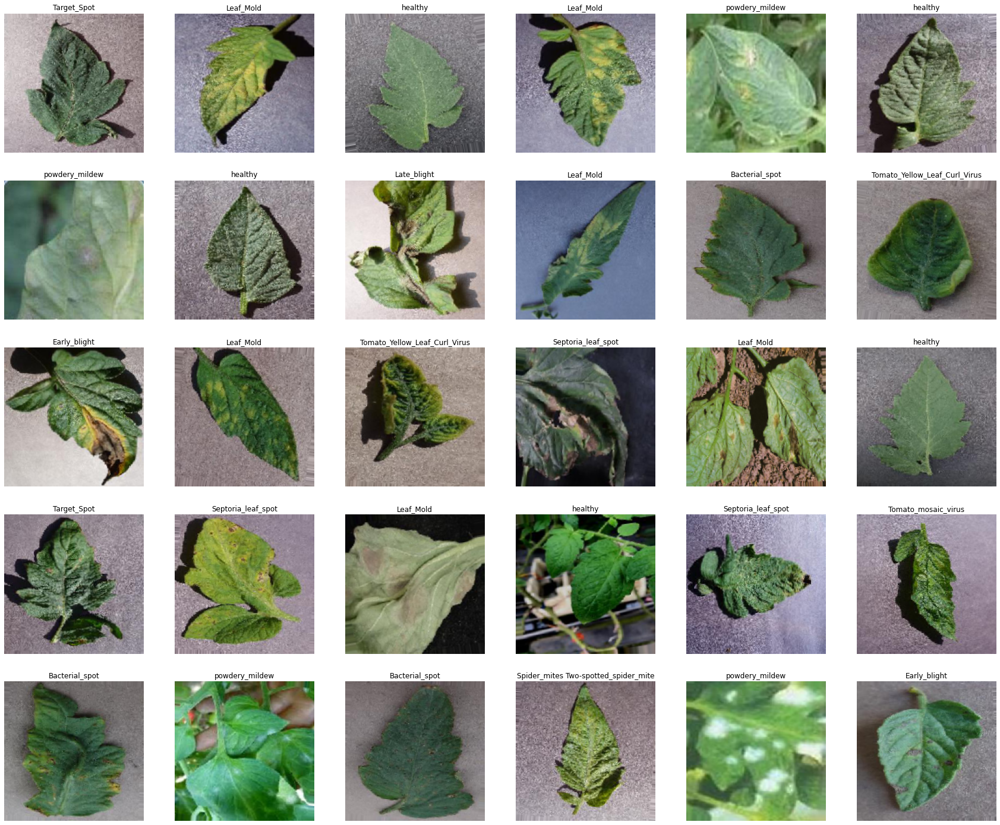

In [10]:
show_images(data=train_ds, class_names=class_names)

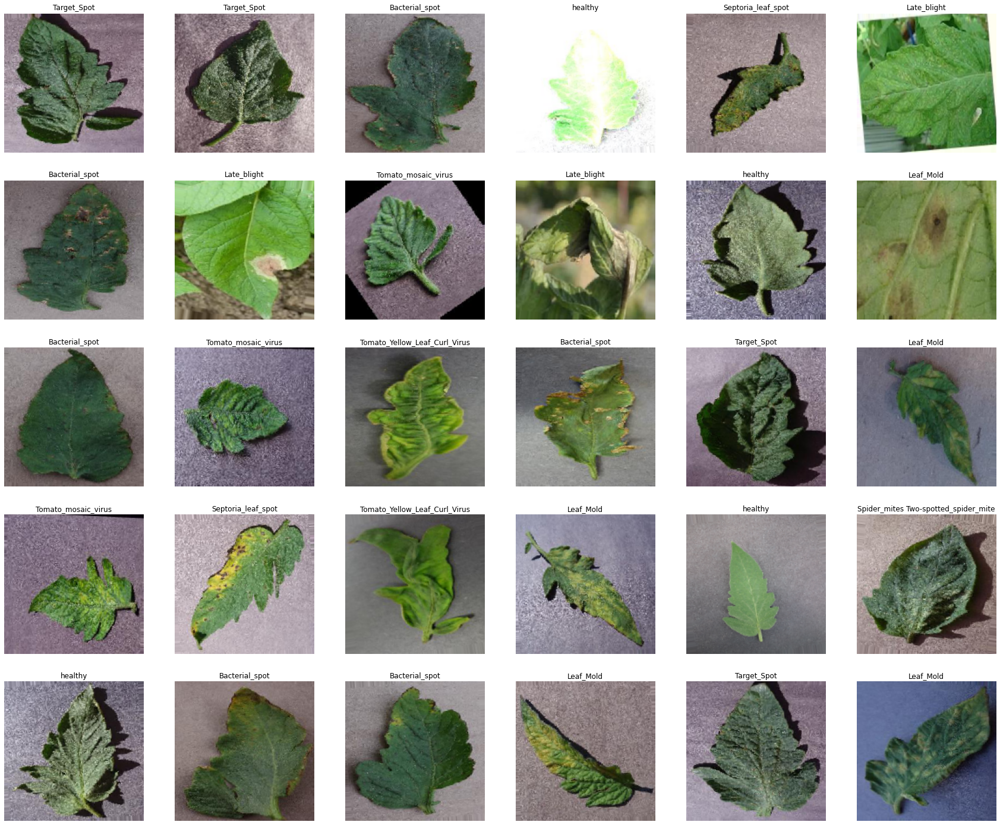

In [11]:
show_images(data=valid_ds, class_names=class_names)

<h3 style='color:Red' ><font color="red" align='center' size=+3 face="Comic Sans MS"> V - Concept-Centric Transformers [CCT] (Expliqué)</font></h3>

selon l'article sur les ***Transformateurs pour la Vision (ViT)***, une architecture basée sur un Transformateur pour la vision nécessite généralement un ensemble de données plus important que d'habitude, ainsi qu'un programme d'entraînement préalable plus long. ImageNet-1k (qui compte environ un million d'images) est considéré comme relevant du régime de données de taille moyenne par rapport aux ViTs. Cela est principalement dû au fait que, contrairement aux CNN, les ViTs (ou une architecture basée sur un Transformateur typique) n'ont pas de biais inductifs bien informés (comme les convolutions pour le traitement des images). Cela soulève la question : ne pourrions-nous pas combiner les avantages des convolutions et les avantages des Transformateurs dans une seule architecture de réseau ? Ces avantages comprennent l'efficacité des paramètres et l'auto-attention pour traiter les dépendances à longue portée et globales (interactions entre différentes régions dans une image).

Dans l'article "Escaping the Big Data Paradigm with Compact Transformers", Hassani et al. présentent une approche pour faire exactement cela. Ils ont proposé l'architecture Compact Convolutional Transformer (CCT). L'architecture est présentée ci-dessous :


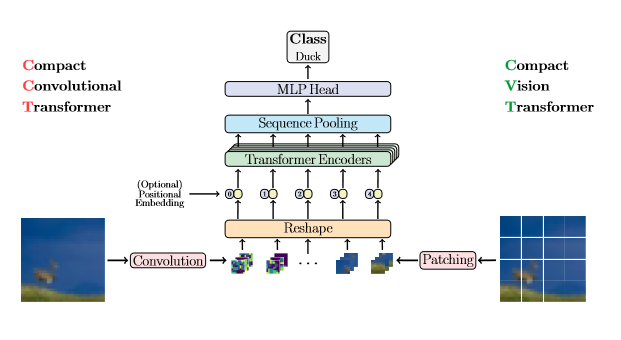

The main difference between **Vision Transformer**, **Compact Vision Transformer** and **Compact Convolutional Transformer** is shown below, 


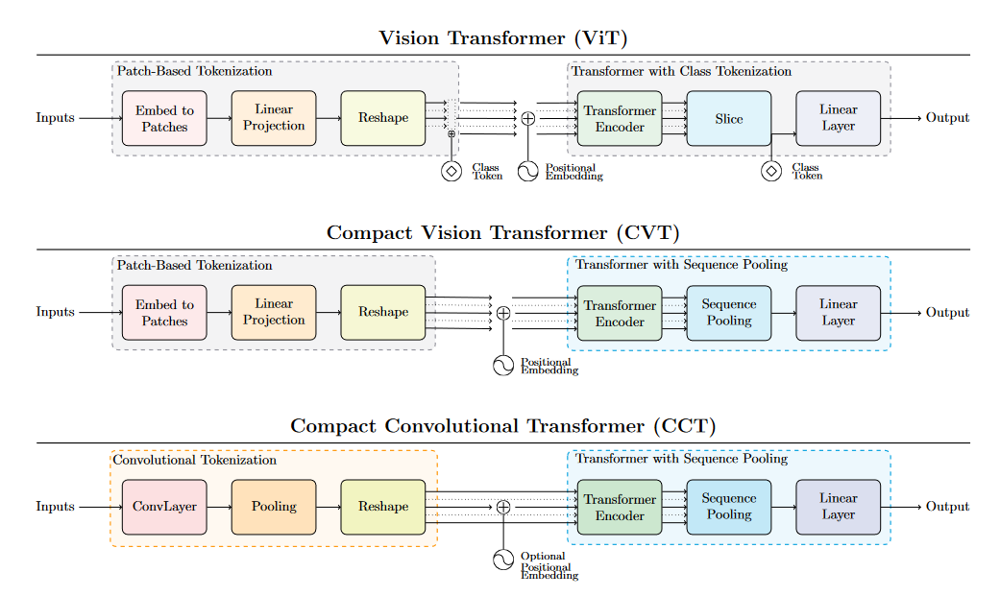

---
$Image Source$ : Original paper. Link to the paper [Escaping the Big Data Paradigm with Compact Transformers](https://arxiv.org/abs/2104.05704)

> <h3 style='color:Red' ><font color="red"  size=+3 face="Comic Sans MS"> VI - Construction et implémentation du modèle CCT. </font></h3>


> <h3 style='color:Red' ><font color="green"  size=+2 > 1) - Convolutional Patcher  </font></h3>

<h3 style='color:Red' ><font color="blue"  size=+1 > "Convolutional Patcher" est un terme qui peut faire référence à une approche spécifique dans le contexte des modèles de vision par ordinateur, en particulier dans le domaine des transformers appliqués à la vision. </font></h3>
 <h3 style='color:Red' ><font color="blue"  size=+1 > 
Dans le contexte des transformers, tels que le Compact Convolutional Transformer (CCT), le terme "Convolutional Patcher" peut se référer à l'utilisation de convolutions localisées sur des parties spécifiques de l'image, appelées "patchs". Contrairement aux convolutions traditionnelles qui opèrent sur l'ensemble de l'image, les convolutions patcher traitent des régions plus petites. Ces patchs sont ensuite utilisés pour capturer les informations locales et sont intégrés dans l'architecture du transformer pour permettre le traitement efficace d'images. Cette approche vise à combiner les avantages des convolutions traditionnelles avec ceux des transformers, améliorant ainsi l'efficacité du modèle pour la tâche de vision par ordinateur.  </font></h3>

In [12]:
class ConvTokenizer(Layer):
    
    def __init__(self, filters, **kwargs):
        super(ConvTokenizer, self).__init__(**kwargs)
        
        self.net = Sequential([
            Conv2D(filters[0], kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='he_normal', use_bias=False, name="TokenizerConv1"),
            ZP(padding=1, name="ZP1"),
            MP(pool_size=3, strides=2, padding='same', name="MP1"),
            Conv2D(filters[1], kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='he_normal', use_bias=False, name="TokenizerConv2"),
            ZP(padding=1, name="ZP2"),
            MP(pool_size=3, strides=2, padding='same', name="MP2"),
        ], name="ConvTokenizer")
        
        self.filters = filters
    
    def call(self, X):
        patches = self.net(X)
        patches = tf.reshape(patches, shape=(-1, patches.shape[1]*patches.shape[2], patches.shape[-1]))
        return patches

    def PE(self, IMAGE_SIZE):
        dummy_inputs  = tf.ones(shape=(1, IMAGE_SIZE, IMAGE_SIZE, 3))
        dummy_outputs = self.call(dummy_inputs)
       
        seq_len  = tf.shape(dummy_outputs)[1]
        proj_dim = tf.shape(dummy_outputs)[-1]
        EL = Embedding(input_dim=seq_len, output_dim=proj_dim, name="PositionalEmbedding")
        return EL, seq_len
            
    def get_config(self):
        base_config = super().get_config()
        return {**base_config,"filters":self.filters}
    



> <h3 style='color:Red' ><font color="green"  size=+2 > 2) - Sequence Pooling </font></h3>

<h3 style='color:Red' ><font color="blue"  size=+1 > Le "Sequence Pooling" est une technique en traitement du langage naturel et en modélisation de séquences où une représentation de taille fixe est générée à partir de séquences d'entrée de longueur variable. Elle condense l'information séquentielle dans un vecteur de dimension fixe, généralement en agrégeant ou résumant les caractéristiques de toute la séquence, facilitant des tâches ultérieures telles que la classification ou la régression.</font></h3>

In [13]:
def SeqPool(x):
    
    rep = LN(epsilon=1e-5, name="LayerNormSeqPool")(x)
    y   = Dense(1, name="LinearTransformation")(rep)
    
    attention_weights = tf.nn.softmax(y, axis=-1)
    weighted_rep = tf.squeeze(tf.matmul(attention_weights, rep, transpose_a=True),axis=-2)
    return weighted_rep


> <h3 style='color:Red' ><font color="green"  size=+2 > 3) - MLP Bloc  </font></h3>

<h3 style='color:Red' ><font color="blue"  size=+1 > Un bloc MLP (Multi-Layer Perceptron) est une composante courante dans les architectures de réseaux de neurones, notamment dans les transformers et les modèles de traitement du langage naturel. Ce bloc est souvent utilisé pour introduire des transformations non linéaires dans le réseau. Il comprend plusieurs couches linéaires (ou entièrement connectées) suivies de fonctions d'activation, permettant au modèle d'apprendre des représentations complexes et non linéaires des données. Les blocs MLP sont utilisés pour extraire des caractéristiques riches des données en introduisant des non-linéarités dans les transformations linéaires successives.  </font></h3>

This is used to create the **dense block, or the MLP** present in the **transformer encoder**.

In [14]:
class MLPBlock(Layer):
    
    def __init__(self, units, rate, **kwargs):
        super(MLPBlock, self).__init__(**kwargs)
        
        self.units = units
        self.rate = rate
        
        self.net = Sequential(name='MLPBlock')
        for unit in units:
            self.net.add(Dense(unit, activation='relu', kernel_initializer='he_normal'))
            self.net.add(Dropout(rate))
    
    def call(self, X):
        return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "units":self.units,
            "rate":self.rate
        }


> <h3 style='color:Red' ><font color="green"  size=+2 > 4) - La régularisation par profondeur stochastique (Stochastic Depth Regularization)   </font></h3>

<h3 style='color:Red' ><font color="blue"  size=+1 > 
La profondeur stochastique est une technique de régularisation qui abandonne aléatoirement un ensemble de couches pendant l'entraînement. Lors de l'inférence, les couches sont conservées telles quelles. Elle est très similaire à Dropout, mais elle opère sur un bloc de couches plutôt que sur des nœuds individuels à l'intérieur d'une couche. Dans CCT, la profondeur stochastique est utilisée juste avant les blocs résiduels d'un encodeur de transformateur.</font></h3>

In [15]:
class StochasticDepthRegularization(Layer):
    
    def __init__(self, drop_rate, **kwargs):
        super(StochasticDepthRegularization, self).__init__(**kwargs)
        
        self.dr = drop_rate
    
    def call(self, x, training=None):
        if training:
            keep_rate = 1 - self.dr
            shape = (tf.shape(x)[0],) + (1,) * (tf.shape(x).shape[0] - 1)
            random_tensor = keep_rate + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            return (x / keep_rate) * random_tensor
        return x



> <h3 style='color:Red' ><font color="green"  size=+2 > 5) - Le Bloc Transformer  </font></h3>

<h3 style='color:Red' ><font color="blue"  size=+1 > 
Ceci est le bloc transformateur, qui se compose du module d'auto-attention et de l'encodeur MLP (Perceptron multi-couche). </font></h3>

In [16]:
def TransformerBlock(x, rates=Drop_Rates, L=2, proj_dim=Dims):
    for i in range(L):
        y = LN(epsilon=1e-5, name="LayerNormTB_Lower_{}".format(i+1))(x)
        y = MHA(num_heads=2, key_dim=Dims, dropout=0.1, name="MHA_{}".format(i+1))(y, y)
        y = StochasticDepthRegularization(drop_rate=rates[i],name="SDR_Lower_{}".format(i+1))(y)
        
        skip = add([y, x], name="SkipConnection_Lower_{}".format(i+1))
        
        y = LN(epsilon=1e-5, name="LayerNormTB_Top_{}".format(i+1))(skip)
        y = MLPBlock(Hidden_units, 0.1, name="MLPBlock_TB_{}".format(i+1))(y)
        y = StochasticDepthRegularization(drop_rate=rates[i],name="SDR_Top_{}".format(i+1))(y)
        
        x = add([y, skip], name="SkipConnection_Top_{}".format(i+1))
    return x

> <h3 style='color:Red' ><font color="green"  size=+2 > 6) - 
L'architecture du modèle CCT (Compact Convolutional Transformer)  </font></h3>
<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Couche d'Entrée (Input Layer):</font></h3>
<p>Prend des images en entrée avec une taille définie.</p>

<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Tokenizer Convolutif (ConvTokenizer):</font></h3>
<p>Utilise une opération de tokenization convolutive pour extraire des caractéristiques des images.</p>

<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Embeddings de Position:</font></h3>
<p>Ajoute des embeddings de position aux tokens pour incorporer l'information de séquence.</p>

<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Bloc Transformer:</font></h3>
<p>Applique un bloc transformer pour capturer les relations complexes entre les tokens.</p>

<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Pooling de Séquence (Sequence Pooling):</font></h3>
<p>Agrège les informations séquentielles en un vecteur fixe par une opération de pooling.</p>

<h3 style='color:Blue' ><font color="blue" align='center' size=+1 face="Arial">Classificateur (Dense Softmax):</font></h3>
<p>Utilise une couche dense avec une activation softmax pour la classification.</p>


In [17]:
# Input Layer
InputL = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

# Tokenizer
Tokenizer = ConvTokenizer(filters=FILTERS, name="ConvTokenizer")
tokens    = Tokenizer(InputL)


# Positional Embeddings
EL, seq_len = Tokenizer.PE(IMAGE_SIZE)
positions   = tf.range(start=0, limit=seq_len, delta=1)
embedding   = EL(positions)
tokens     += embedding

# Transformer Block
encodings = TransformerBlock(tokens)

# Sequence Pooling
pooled = SeqPool(encodings)

# Classifier
OutputL = Dense(n_classes, activation='softmax', name="OutptLayer")(pooled)

# Model
model = Model(InputL, OutputL, name="CCT")
model.summary()

Model: "CCT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputLayer (InputLayer)         [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
ConvTokenizer (ConvTokenizer)   (None, 1600, 128)    75456       InputLayer[0][0]                 
__________________________________________________________________________________________________
tf.__operators__.add (TFOpLambd (None, 1600, 128)    0           ConvTokenizer[0][0]              
__________________________________________________________________________________________________
LayerNormTB_Lower_1 (LayerNorma (None, 1600, 128)    256         tf.__operators__.add[0][0]       
________________________________________________________________________________________________


> <h3 style='color:Red' ><font color="green"  size=+2 > 7) - Visualization du modèle  </font></h3>

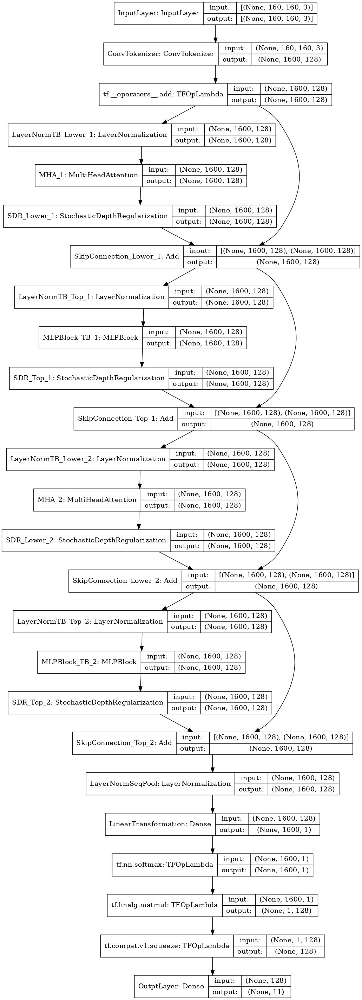

In [18]:
plot_model(model, "CCT.png", dpi=100, show_shapes=True)


<h3 style='color:Red' ><font color="red"  size=+3  > VII) - L'entraînement du modèle CCT (Compact Convolutional Transformer)  </font></h3>


In [19]:
# Compile
opt = AdamW(learning_rate=Learning_Rate, weight_decay=Weight_Decay)
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=opt,
    metrics=[
        Accuracy(name="Top1Accuracy"), TopKAccuracy(k=3, name="Top3Accuracy")
    ]
)

In [23]:
history = model.fit(
    train_ds,
    validation_data=valid_ds, 
    epochs=50
)

Epoch 1/50
808/808 [==============================] - 308s 380ms/step - loss: 16.5592 - Top1Accuracy: 0.5479 - Top3Accuracy: 0.8098 - val_loss: 17.3562 - val_Top1Accuracy: 0.4981 - val_Top3Accuracy: 0.7751
Epoch 2/50
808/808 [==============================] - 284s 351ms/step - loss: 11.4741 - Top1Accuracy: 0.6001 - Top3Accuracy: 0.8481 - val_loss: 12.1486 - val_Top1Accuracy: 0.5525 - val_Top3Accuracy: 0.8561
Epoch 3/50
808/808 [==============================] - 281s 347ms/step - loss: 8.7622 - Top1Accuracy: 0.6318 - Top3Accuracy: 0.8680 - val_loss: 15.9328 - val_Top1Accuracy: 0.4828 - val_Top3Accuracy: 0.7608
Epoch 4/50
808/808 [==============================] - 280s 346ms/step - loss: 7.0443 - Top1Accuracy: 0.6583 - Top3Accuracy: 0.8798 - val_loss: 5.4666 - val_Top1Accuracy: 0.6840 - val_Top3Accuracy: 0.8993
Epoch 5/50
808/808 [==============================] - 282s 349ms/step - loss: 5.4351 - Top1Accuracy: 0.6884 - Top3Accuracy: 0.8950 - val_loss: 4.2871 - val_Top1Accuracy: 0.6688 - 

<h3 style='color:Red' ><font color="red"  size=+3  > VIII) - L'évaluation du modèle CCT (Compact Convolutional Transformer)   </font></h3>



> <h3 style='color:Red' ><font color="green"  size=+2 > 1) - performances du modèle  </font></h3>

In [29]:
lc.iloc[-1:]

,loss,Top1Accuracy,Top3Accuracy,val_loss,val_Top1Accuracy,val_Top3Accuracy
49,0.270177,0.907857,0.985068,0.247438,0.924297,0.98444



> <h3 style='color:Red' ><font color="green"  size=+2 > 2) - évolution des performances du modèle  </font></h3>

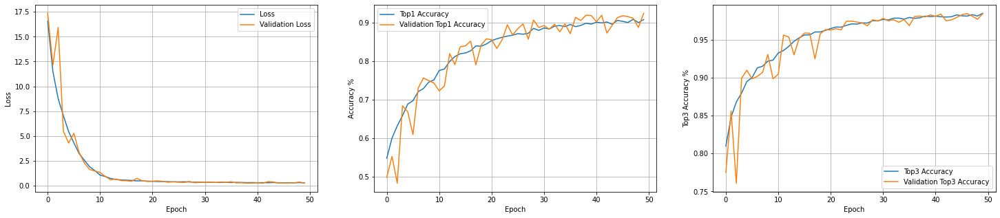

In [30]:
# Learning curve figure
plt.figure(figsize=(25,5))

# Subplot
plt.subplot(1,3,1)
plt.plot(lc['loss'], label='Loss')
plt.plot(lc['val_loss'], label='Validation Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.plot(lc['Top1Accuracy'], label='Top1 Accuracy')
plt.plot(lc['val_Top1Accuracy'], label='Validation Top1 Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy %")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.plot(lc['Top3Accuracy'], label='Top3 Accuracy')
plt.plot(lc['val_Top3Accuracy'], label='Validation Top3 Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Top3 Accuracy %")
plt.legend()
plt.grid()

plt.show()

<h3 style='color:Red' ><font color="blue"  size=+2 > C'est exactement comme une courbe d'apprentissage parfaite. La perte diminue continuellement, la précision augmente progressivement. La précision Top 1 finale est passée à 91 % et la précision Top 3 est passée à 98 %. Sur les 3 courbes, les données de validation ne quittent jamais les données d'entraînement et le surajustement ne se produit jamais.  </font></h3>

<h3 style='color:Red' ><font color="red"  size=+3  > IIVV) - CCT - Predictions  </font></h3>


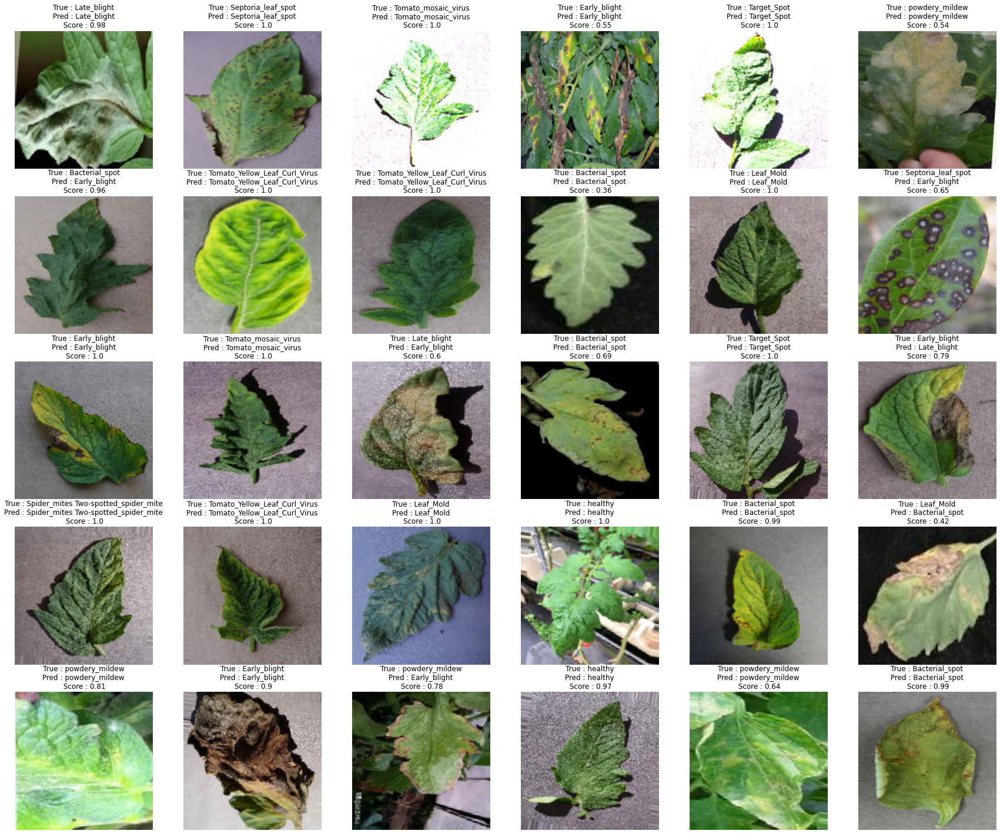

In [31]:
show_images(data=valid_ds, class_names=class_names, model=model)